In [1]:
import glob

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

from pylab import rcParams
from IPython.display import display

from bokeh.io import output_notebook

from utils import *

output_notebook()

Loading BokehJS ...

In [2]:
rcParams['figure.figsize'] = 20, 5
pd.set_option('display.max_columns', None)

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
# df = drop_boring_columns(summarize_logs(read_json_log('./experiments/logreg-wide.log')))
# df.to_pickle('./experiments/logreg-wide.pkl')

In [5]:
df = pd.read_pickle('./experiments/logreg-wide.pkl')

In [6]:
display(shaderdots(df, 'min_dev_auc', 'min_whole_validation_auc', 700, 700))

In [7]:
display(shaderdots(df, 'mean_dev_auc', 'min_whole_validation_auc', 700, 700))

In [8]:
df.describe()

,experiment_id,param_clf__C,param_clf__class_weight,param_clf__random_state,param_clf__tol,mean_train_binary_logloss,mean_train_auc,mean_train_binary_error,mean_dev_binary_logloss,min_dev_binary_logloss,max_dev_binary_logloss,mean_dev_auc,min_dev_auc,max_dev_auc,mean_dev_binary_error,min_dev_binary_error,max_dev_binary_error,mean_validation_binary_logloss,min_validation_binary_logloss,max_validation_binary_logloss,mean_validation_auc,min_validation_auc,max_validation_auc,mean_validation_binary_error,min_validation_binary_error,max_validation_binary_error,mean_whole_train_binary_logloss,min_whole_train_binary_logloss,max_whole_train_binary_logloss,mean_whole_train_auc,min_whole_train_auc,max_whole_train_auc,mean_whole_train_binary_error,min_whole_train_binary_error,max_whole_train_binary_error,mean_whole_validation_binary_logloss,min_whole_validation_binary_logloss,max_whole_validation_binary_logloss,mean_whole_validation_auc,min_whole_validation_auc,max_whole_validation_auc,mean_whole_validation_binary_error,min_whole_validation_binary_error,max_whole_validation_binary_error,cnt
count,5000.000000,5000.000000,5000.000000,5000.000000,5.000000e+03,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.0
mean,2499.500000,57.657560,10.604049,50317.743800,5.211927e-04,0.874571,0.808544,0.642884,0.877500,0.864134,0.888972,0.805484,0.791955,0.832610,0.642030,0.636490,0.648324,0.897754,0.893736,0.902181,0.788041,0.786127,0.790038,0.636518,0.632702,0.639660,0.874464,0.874464,0.874464,0.807854,0.807854,0.807854,0.643324,0.643324,0.643324,0.895816,0.895816,0.895816,0.789576,0.789576,0.789576,0.637515,0.637515,0.637515,3.0
std,1443.520003,159.606238,20.011313,28492.672487,1.509431e-03,0.394415,0.087141,0.159717,0.394486,0.396973,0.393974,0.086769,0.093695,0.083489,0.159564,0.161527,0.158700,0.399650,0.397055,0.403369,0.075443,0.076376,0.074804,0.158623,0.161769,0.156313,0.393716,0.393716,0.393716,0.087391,0.087391,0.087391,0.159051,0.159051,0.159051,0.399414,0.399414,0.399414,0.076033,0.076033,0.076033,0.158162,0.158162,0.158162,0.0
min,0.000000,0.000010,0.010000,24.000000,1.001884e-10,0.425952,0.352992,0.265353,0.430391,0.408081,0.442940,0.351550,0.304839,0.392171,0.265353,0.265306,0.265542,0.452775,0.450448,0.454512,0.382955,0.380365,0.386129,0.265436,0.265436,0.265436,0.426884,0.426884,0.426884,0.355557,0.355557,0.355557,0.265353,0.265353,0.265353,0.450448,0.450448,0.450448,0.386129,0.386129,0.386129,0.265436,0.265436,0.265436,3.0
25%,1249.750000,0.000888,0.098448,25750.500000,9.413785e-09,0.561867,0.820773,0.558906,0.564313,0.550262,0.575121,0.819114,0.804901,0.851617,0.556264,0.546483,0.567879,0.578254,0.577035,0.579363,0.800112,0.799038,0.801153,0.542761,0.533534,0.548616,0.562327,0.562327,0.562327,0.820847,0.820847,0.820847,0.560126,0.560126,0.560126,0.577517,0.577517,0.577517,0.801153,0.801153,0.801153,0.544890,0.544890,0.544890,3.0
50%,2499.500000,0.107755,0.937790,49998.000000,8.445717e-07,0.754859,0.833584,0.734647,0.758092,0.744962,0.771038,0.830016,0.819281,0.854937,0.734647,0.734458,0.734694,0.775607,0.772285,0.778656,0.809362,0.807214,0.811300,0.734564,0.734564,0.734564,0.755277,0.755277,0.755277,0.832845,0.832845,0.832845,0.734647,0.734647,0.734647,0.773473,0.773473,0.773473,0.811078,0.811078,0.811078,0.734564,0.734564,0.734564,3.0
75%,3749.250000,12.464189,10.472366,74930.250000,9.189029e-05,1.120123,0.836399,0.734647,1.124882,1.109087,1.137462,0.832389,0.821572,0.855495,0.734647,0.734458,0.734694,1.146785,1.140965,1.151203,0.810452,0.808617,0.812877,0.734564,0.734564,0.734564,1.119774,1.119774,1.119774,0.835533,

In [9]:
df['overfit_auc'] = df.mean_train_auc - df.mean_dev_auc
df['range_auc'] = df.max_dev_auc - df.min_dev_auc
df['whole_range_auc'] = df.max_whole_validation_auc - df.min_whole_validation_auc
df['whole_cv_diff_min_auc'] = df.min_whole_validation_auc - df.min_validation_auc
df['whole_cv_diff_mean_auc'] = df.mean_whole_validation_auc - df.mean_validation_auc

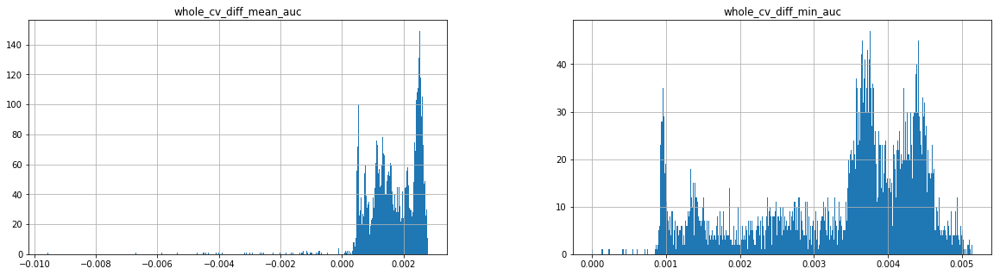

In [10]:
df[['whole_cv_diff_min_auc', 'whole_cv_diff_mean_auc']][df.mean_train_auc > 0.65].hist(bins=500);

In [11]:
display(shaderdots(df, 'param_clf__C', 'mean_dev_auc', 500, 300,  x_axis_type='log'))

In [12]:
display(shaderdots(df, 'param_clf__class_weight', 'mean_dev_auc', 500, 300,  x_axis_type='log'))

In [13]:
display(shaderdots(df, 'param_clf__tol', 'mean_dev_auc', 500, 300,  x_axis_type='log'))

In [14]:
display(shaderdots(df, 'param_clf__C', 'overfit_auc', 500, 300,  x_axis_type='log'))

In [15]:
display(shaderdots(df, 'param_clf__class_weight', 'overfit_auc', 500, 300,  x_axis_type='log'))

In [16]:
display(shaderdots(df, 'param_clf__C', 'range_auc', 500, 300,  x_axis_type='log'))

In [17]:
display(shaderdots(df, 'param_clf__class_weight', 'range_auc', 500, 300,  x_axis_type='log'))

In [18]:
best = df.sort_values('mean_dev_auc').iloc[-100:]

In [19]:
compare_columns = ['mean_dev_auc', 'mean_validation_auc',
               'mean_whole_validation_auc', 'min_dev_auc', 'min_validation_auc', 'min_whole_validation_auc']

In [20]:
best[compare_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,100.0,0.832781,0.000021,0.832751,0.832764,0.832779,0.832795,0.832830
mean_validation_auc,100.0,0.810470,0.000071,0.810302,0.810436,0.810463,0.810508,0.810696
mean_whole_validation_auc,100.0,0.813022,0.000103,0.812766,0.812965,0.812998,0.813080,0.813275
min_dev_auc,100.0,0.821932,0.000331,0.820868,0.821850,0.822028,0.822132,0.822363
min_validation_auc,100.0,0.808783,0.000206,0.808051,0.808728,0.808820,0.808890,0.809136
min_whole_validation_auc,100.0,0.813022,0.000103,0.812766,0.812965,0.812998,0.813080,0.813275


In [21]:
best.filter(regex='^param').describe()

,param_clf__C,param_clf__class_weight,param_clf__random_state,param_clf__tol
count,100.000000,100.000000,100.000000,1.000000e+02
mean,3.557688,0.358117,49921.890000,6.111559e-04
std,5.337308,0.153913,28826.305697,1.355988e-03
min,0.249234,0.011095,577.000000,1.390468e-10
25%,0.899388,0.258448,24272.000000,8.559105e-09
50%,1.794156,0.353213,47465.500000,2.911245e-06
75%,3.998564,0.482746,75615.750000,5.032052e-04
max,35.950349,0.753491,98529.000000,7.894191e-03


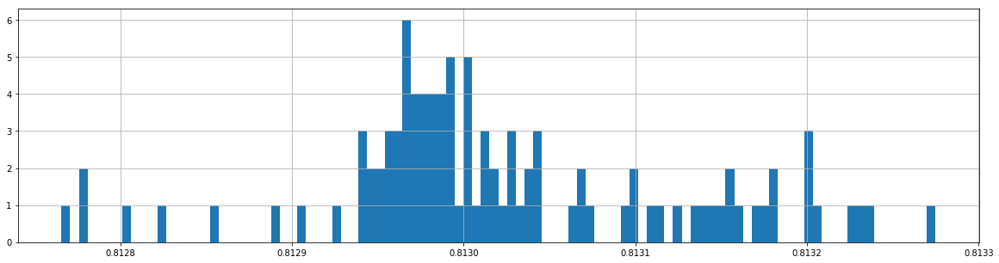

In [22]:
best.min_whole_validation_auc.hist(bins=100);

In [23]:
best.overfit_auc.describe()

count    100.000000
mean       0.003872
std        0.000044
min        0.003746
25%        0.003843
50%        0.003882
75%        0.003906
max        0.003943
Name: overfit_auc, dtype: float64

random seed is useless for logreg lbfgs

In [24]:
best.whole_range_auc.describe()

count    100.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: whole_range_auc, dtype: float64

In [25]:
thin = df[
    (df.param_clf__C > 1e-3)
    & (df.param_clf__C < 1e-2)
    & (df.param_clf__class_weight > 1)
    & (df.param_clf__class_weight < 10)
]

In [26]:
thin[compare_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,146.0,0.829687,0.002402,0.822736,0.828139,0.830485,0.831611,0.832285
mean_validation_auc,146.0,0.809943,0.001887,0.803869,0.809022,0.810610,0.811390,0.812010
mean_whole_validation_auc,146.0,0.811605,0.002016,0.805204,0.810623,0.812146,0.813121,0.813840
min_dev_auc,146.0,0.817925,0.002838,0.809651,0.816177,0.818499,0.820090,0.821733
min_validation_auc,146.0,0.808631,0.001808,0.802758,0.807739,0.809300,0.810073,0.810575
min_whole_validation_auc,146.0,0.811605,0.002016,0.805204,0.810623,0.812146,0.813121,0.813840


In [27]:
display(shaderdots(thin, 'param_clf__C', 'mean_dev_auc', 500, 300,  x_axis_type='log'))

In [28]:
display(shaderdots(thin, 'param_clf__C', 'overfit_auc', 500, 300,  x_axis_type='log'))

In [29]:
display(shaderdots(thin, 'param_clf__C', 'range_auc', 500, 300,  x_axis_type='log'))

In [30]:
display(shaderdots(thin, 'param_clf__class_weight', 'mean_dev_auc', 500, 300))
display(shaderdots(thin, 'param_clf__class_weight', 'overfit_auc', 500, 300))
display(shaderdots(thin, 'param_clf__class_weight', 'range_auc', 500, 300))

In [31]:
display(shaderdots(thin, 'mean_dev_auc', 'min_whole_validation_auc', 700, 700))